In [131]:
# data processing
import pandas as pd
import numpy as np

# data visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

## Read Data

In [132]:
items = pd.read_csv("../data/raw/items.csv", sep='|')

In [18]:
items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22035 entries, 0 to 22034
Data columns (total 11 columns):
pid               22035 non-null int64
manufacturer      22035 non-null int64
group             22035 non-null object
content           22035 non-null object
unit              22035 non-null object
pharmForm         19708 non-null object
genericProduct    22035 non-null int64
salesIndex        22035 non-null int64
category          17408 non-null float64
campaignIndex     1338 non-null object
rrp               22035 non-null float64
dtypes: float64(2), int64(4), object(5)
memory usage: 1.8+ MB


In [59]:
items.apply(pd.Series.nunique)

pid               22035
manufacturer       1067
group               533
content             548
unit                  8
pharmForm           278
genericProduct        2
salesIndex            4
category            409
campaignIndex         3
rrp                3289
dtype: int64

In [25]:
items.head()

,pid,manufacturer,group,content,unit,pharmForm,genericProduct,salesIndex,category,campaignIndex,rrp
0,1,1,2FOI,80,ST,TAB,0,40,NaN,NaN,10.89
1,2,1,2FOI,80,ST,Tab,0,40,NaN,NaN,10.89
2,3,1,2FOI,10,G,GLO,0,40,NaN,NaN,16.45
3,4,1,2FOI,80,ST,TAB,0,40,NaN,NaN,10.89
4,5,2,10OJ03JS,8,ST,PUL,0,40,1.0,NaN,22.53


In [133]:
train = pd.read_csv("../data/raw/train.csv", sep = '|')

In [134]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2756003 entries, 0 to 2756002
Data columns (total 11 columns):
lineID             int64
day                int64
pid                int64
adFlag             int64
availability       int64
competitorPrice    float64
click              int64
basket             int64
order              int64
price              float64
revenue            float64
dtypes: float64(3), int64(8)
memory usage: 231.3 MB


In [135]:
# join the item table with the training set by pid
train = pd.merge(train, items, how = "left", on= "pid")

In [109]:
train.head(10).T

,0,1,2,3,4,5,6,7,8,9
lineID,1,2,3,4,5,6,7,8,9,10
day,1,1,1,1,1,1,1,1,1,1
pid,6570,14922,16382,1145,3394,3661,3856,16963,14560,4853
adFlag,0,1,0,1,0,0,1,0,0,1
availability,2,1,1,1,1,1,1,1,1,1
competitorPrice,14.6,8.57,14.77,6.59,4.39,13.66,3.03,8.78,10.84,9.12
click,1,0,0,0,0,0,0,1,1,1
basket,0,1,1,0,0,0,0,0,0,0
order,0,0,0,1,1,1,1,0,0,0
price,16.89,8.75,16.06,6.55,4.14,10.03,3.58,8.75,12.04,8.75


In [62]:
train[train.columns.difference(['lineID','pid','competitorPrice','price','revenue','rrp'])].apply(pd.Series.nunique)

adFlag               2
availability         4
basket               2
campaignIndex        3
category           409
click                2
content            548
day                 92
genericProduct       2
group              533
manufacturer      1065
order                2
pharmForm          278
salesIndex           4
unit                 8
dtype: int64

In [12]:
test = pd.read_csv("../data/raw/class.csv", sep = '|')

In [13]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1210767 entries, 0 to 1210766
Data columns (total 7 columns):
lineID             1210767 non-null int64
day                1210767 non-null int64
pid                1210767 non-null int64
adFlag             1210767 non-null int64
availability       1210767 non-null int64
competitorPrice    1172762 non-null float64
price              1210767 non-null float64
dtypes: float64(2), int64(5)
memory usage: 64.7 MB


In [111]:
test.tail() 

,lineID,day,pid,adFlag,availability,competitorPrice,price
1210762,1210763,123,11241,1,1,9.78,9.85
1210763,1210764,123,4900,1,1,13.19,14.25
1210764,1210765,123,20837,0,1,7.13,9.85
1210765,1210766,123,3850,1,1,3.52,4.90
1210766,1210767,123,5664,0,1,12.75,15.36


There are missing values in the columns 'pharmForm', 'category', 'campaignIndex' and 'competitorPrice'. Also, some categorical variables have high dimensions.

## Explore Variables

In [54]:
print("total number of unique items: %d" % items.pid.nunique())
print("number of unique items in the training set %d"%train.pid.nunique())
print("number of unique items in the test set %d"%test.pid.nunique())
print("number of unique items both in the training and test sets %d"% len(set.intersection(set(train.pid),set(test.pid))))

total number of unique items: 22035
number of unique items in the training set 21928
number of unique items in the test set 20525
number of unique items both in the training and test sets 20425


In [66]:
train.columns

Index(['lineID', 'day', 'pid', 'adFlag', 'availability', 'competitorPrice',
       'click', 'basket', 'order', 'price', 'revenue', 'manufacturer', 'group',
       'content', 'unit', 'pharmForm', 'genericProduct', 'salesIndex',
       'category', 'campaignIndex', 'rrp'],
      dtype='object')

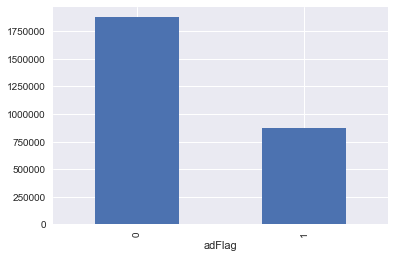

In [67]:
train.groupby("adFlag")['lineID'].count().plot.bar()

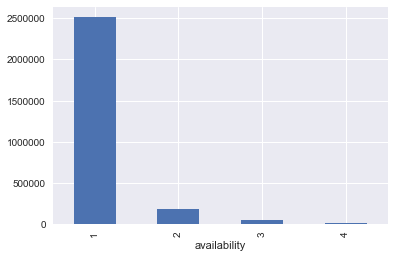

In [68]:
train.groupby("availability")['lineID'].count().plot.bar()

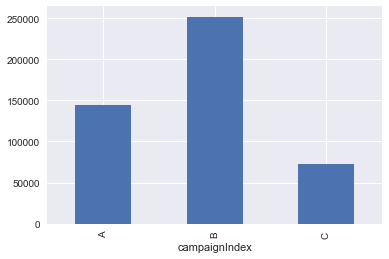

In [71]:
train.groupby("campaignIndex")['lineID'].count().plot.bar()

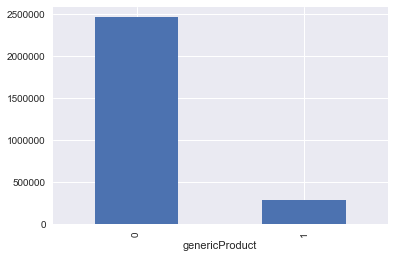

In [75]:
train.groupby("genericProduct")['lineID'].count().plot.bar()

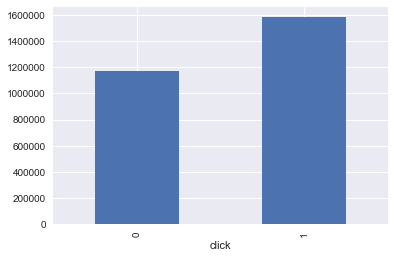

In [72]:
train.groupby("click")['lineID'].count().plot.bar()

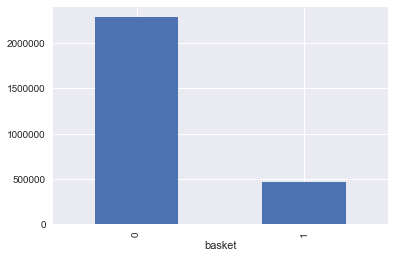

In [73]:
train.groupby("basket")['lineID'].count().plot.bar()

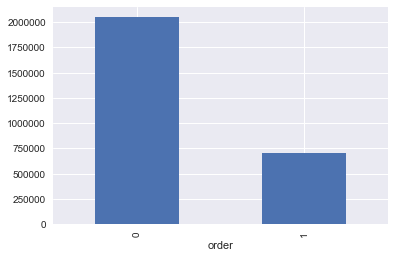

In [74]:
train.groupby("order")['lineID'].count().plot.bar()

In [136]:
sample_train = train.sample(n=50000, random_state=2017) #sufficient to check the trend

In [99]:
trace1 = go.Scatter3d(
    x=sample_train.ix[:,"rrp"],
    y=sample_train.ix[:,"competitorPrice"],
    z=sample_train.ix[:,"price"],
    mode='markers',
    marker=dict(
        size = 5,
        color = sample_train['order'].values,
        colorscale = 'Portland',
        colorbar = dict(title = 'Is_order'),
        line=dict(color='rgb(255, 255, 255)'),
        opacity=0.75
    )
)

data=[trace1]
layout=go.Layout(height=800, width=800, title='Correlation of Prices in Sample Data', 
                 scene = go.Scene(xaxis= dict(title = "ReferencePrice"), yaxis=dict(title = "CmpetitorPrice"), 
                        zaxis = go.ZAxis(title="SalePrice")))
fig=dict(data=data, layout=layout)
py.iplot(fig, filename='3DBubble')

In [145]:
data = [{
            'x': sample_train.ix[:,'day'],
            'y': sample_train[sample_train[col_name]==1]['price'],
            'name': col_name, 'mode': 'markers', 'opacity':0.8, 'marker': dict(size=3)
        } for col_name in ['click', 'basket', 'order']]

In [146]:
layout = go.Layout(title = "Price by actions", yaxis = dict(title='Price'), xaxis = dict(title='Day'))

In [147]:
fig=dict(data=data, layout=layout)
py.iplot(fig, filename='scatter plot')

It seems that prices that resulted in "order" are relatively lower that the others with less outliers.

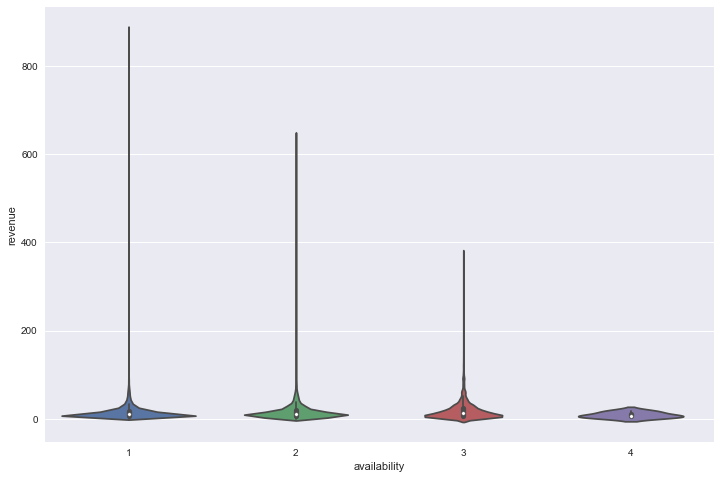

In [150]:
plt.figure(figsize=(12, 8))
sns.violinplot(x = 'availability', y = 'revenue', data = train[train.order==1])